In [11]:
import numpy as np
from eryn.backends import HDFBackend as eryn_HDF_Backend
import matplotlib.pyplot as plt
import corner
import os
import warnings
import matplotlib.lines as mlines
from matplotlib.font_manager import FontProperties
plt.rcParams['font.size'] = 20

notebook_direc = os.getcwd()
plot_direc = notebook_direc + "/plots"
run_direc = notebook_direc + "/PE_samples"

FM_direc = notebook_direc + "/fisher_matrices"

os.listdir(FM_direc)

['case_1', 'case_2', 'case_3', 'case_4', 'case_1_1eneg2_modes']

In [2]:
# Now analyse the results using 9PN for circular orbits
    
def analyse_samples(file_path, discard = 0, plot_log_like = True):
    reader = eryn_HDF_Backend(file_path,read_only = True)

    N_iterations = reader.get_chain()['model_0'].shape[0]
    N_temps = reader.get_chain()['model_0'].shape[1]
    N_walkers = reader.get_chain()['model_0'].shape[2]
    N_params = reader.get_chain()['model_0'].shape[-1]

    samples_after_burnin = [reader.get_chain(discard = discard)['model_0'][:,i].reshape(-1,N_params) 
                        for i in range(N_temps)]  # Take true chain]

    log_like = reader.get_log_like(discard = discard)

    if plot_log_like:
        plt.plot(log_like[:,0,:]);
        plt.xlabel(r'Iteration')
        plt.ylabel(r'Log likelihood')
        plt.show()
    return samples_after_burnin, reader, log_like, N_params,

def corner_plot(burned_samples, true_params, param_labels, corner_kwargs, title = r'Corner plot', plot_name = None):
    N_params = len(param_labels)
    true_params = true_params[0:N_params]
    trunc_samples = burned_samples[0][:,:N_params]
    print(trunc_samples.shape)
    
    samples_corner = np.column_stack(trunc_samples)

    figure = corner.corner(trunc_samples,bins = 30, color = 'blue', **corner_kwargs)

    
    axes = np.array(figure.axes).reshape((N_params, N_params))

    for i in range(N_params):
        ax = axes[i, i]
        ax.axvline(true_params[i], color="k")

    for yi in range(N_params):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axhline(true_params[yi], color="k")
            ax.axvline(true_params[xi],color= "k")
            ax.plot(true_params[xi], true_params[yi], "sk")

    for ax in figure.get_axes():
        ax.tick_params(axis='both', labelsize=18)

    blue_line = mlines.Line2D([], [], color='blue', label=r'Posterior Distributions')
    black_line = mlines.Line2D([], [], color='black', label='True Value')

    # plt.legend(handles=[blue_line,black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = title, title_fontproperties = FontProperties(size = , weight = 'bold'))
    # plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)
    if plot_name:
        plt.savefig(plot_name, bbox_inches = "tight")
    return figure

def remove_bad_walkers(reader_from_sampler, log_like_threshold = -170, burn = 400, plot_log_like = True):

    
    N_temps = reader_from_sampler.get_chain()['model_0'].shape[1]
    N_params = reader_from_sampler.get_chain()['model_0'].shape[-1]
    samples = reader_from_sampler.get_chain(discard = burn)['model_0']
    log_like = reader_from_sampler.get_log_like(discard = burn)
    
    # Define the log-likelihood threshold
    log_like_threshold = -170
    
    # Identify walkers that ever go below the threshold
    bad_walkers = np.any(log_like < log_like_threshold, axis=0)  # Shape: (1, 50)
    
    # Convert to boolean mask (negate to keep good walkers)
    good_walkers_mask = ~bad_walkers.squeeze()  # Shape: (50,)
    
    # Apply the mask to remove bad walkers
    filtered_log_like = log_like[:, :, good_walkers_mask]  # New shape: (1208, 1, <fewer walkers>)
    filtered_samples = samples[:, :, good_walkers_mask, :, :]  # New shape: (1208, 1, <fewer walkers>, 1, 12)

    recast_samples = [filtered_samples[:,i].reshape(-1,N_params) for i in range(N_temps)]  # Take true chain]  

    if plot_log_like:
        plt.plot(filtered_log_like[:,0,:]);
        plt.xlabel(r'Iteration')
        plt.ylabel(r'Log likelihood -- cleaned')
        plt.show()
    
    return filtered_log_like, recast_samples

import h5py

def save_samples_h5(samples, no_samples = 30000, 
                    true_vals = None, 
                    file_name = "samples.h5", param_labels = "param_labels",
                    file_path = None):
    samples_array = samples[0]
    
    # Truncate to last 30,000 samples
    truncated_samples = samples_array[-1*no_samples:, :]
    
    # Parameter labels and true values
    params_label_full = [r"$M/M_{\odot}$", r"$\mu/M_{\odot}$", r"$a$", 
                         r"$p_{0}$", r"$e_{0}$", r"$D_{s}/Gpc$", 
                         r"$\theta_{S}$", r"$\phi_{S}$", r"$\theta_{K}$", r"$\phi_{K}$", 
                         r"$\Phi_{\phi_{0}}$", r"$\Phi_{r_{0}}$"]
    
    true_vals_EMRI_case_1 = [1e6, 10.0, 0.998, 7.7275, 0.73, 2.204, 0.8, 2.2, 1.6, 1.2, 2.0, 3.0]
    
    # Create dictionary for samples
    samples_dict = {
        label: truncated_samples[:, i] for i, label in enumerate(params_label_full)
    }
    
    # Save to .h5 file
    with h5py.File(file_path + file_name, "w") as f:
        # Save each parameter's samples
        for key, values in samples_dict.items():
            f.create_dataset(f"samples/{key}", data=values)
        
        # Save true values
        f.create_dataset("true_values", data=true_vals)
        
        # Save parameter labels (as fixed-length ASCII strings)
        dt = h5py.string_dtype(encoding='utf-8')
        f.create_dataset(param_labels, data=np.array(params_label_full, dtype=dt))


def load_samples_h5(file_path):
    with h5py.File(file_path, "r") as f:
        # Load parameter labels
        param_labels = [label.decode('utf-8') if isinstance(label, bytes) else label
                        for label in f["param_labels"][()]]

        # Load true values
        true_vals = f["true_values"][()]

        # Load samples into a dictionary
        samples_dict = {}
        for label in param_labels:
            samples_dict[label] = f[f"samples/{label}"][()]

    return samples_dict, param_labels, true_vals

In [16]:

file_path_1eneg5 = run_direc + "/Case_1_EMRI_prograde" + "/prograde_EMRI_case_1_1eneg5.h5"

burned_samples_dict_EMRI_1eneg5, param_labels, true_vals_EMRI_case_1 =  load_samples_h5(file_path_1eneg5)

burned_samples_EMRI_1eneg5 = list(burned_samples_dict_EMRI_1eneg5.values())

N_params = len(param_labels)
N_samples = len(burned_samples_EMRI_1eneg5[0])

std_vecs = [np.std(burned_samples_EMRI_1eneg5[j]) for j in range(N_params)]
mean_vecs = np.array([np.mean(burned_samples_EMRI_1eneg5[j]) for j in range(N_params)])

fname = FM_direc + "/case_1/Fisher.h5"
with h5py.File(fname, "r") as f:
    FM = f["Fisher"][:,:]

Cov_Matrix = np.linalg.inv(FM)

FM_approx_samples = np.random.multivariate_normal(mean_vecs, Cov_Matrix, len(burned_samples_EMRI_1eneg5[0]))

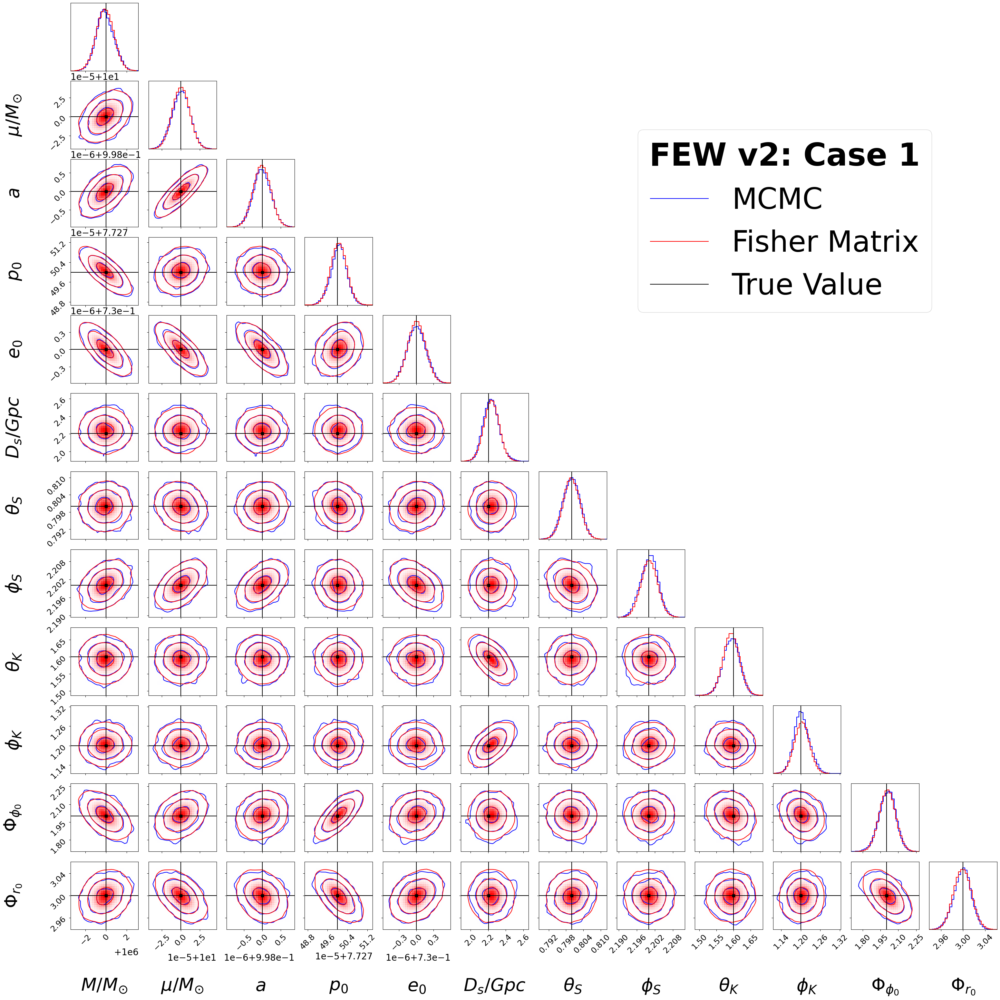

In [18]:

params_label_full = param_labels
N_params = len(param_labels)
corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(burned_samples_EMRI_1eneg5)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

corner.corner(FM_approx_samples, fig = figure, bins = 30, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI_case_1[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI_case_1[yi], color="k")
        ax.axvline(true_vals_EMRI_case_1[xi],color= "k")
        ax.plot(true_vals_EMRI_case_1[xi], true_vals_EMRI_case_1[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'MCMC')
red_line = mlines.Line2D([], [], color='red', label=r'Fisher Matrix')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "FEW v2: Case 1", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



In [19]:
file_path_1eneg5 = run_direc + '/Case_2_extreme_EMRI_prograde' + "/Extreme_EMRI_case_2_1eneg5.h5"

burned_samples_dict_EMRI_1eneg5, param_labels, true_vals_EMRI_case_1 =  load_samples_h5(file_path_1eneg5)

burned_samples_EMRI_1eneg5 = list(burned_samples_dict_EMRI_1eneg5.values())

N_params = len(param_labels)
N_samples = len(burned_samples_EMRI_1eneg5[0])

std_vecs = [np.std(burned_samples_EMRI_1eneg5[j]) for j in range(N_params)]
mean_vecs = np.array([np.mean(burned_samples_EMRI_1eneg5[j]) for j in range(N_params)])

fname = FM_direc + "/case_2/Fisher.h5"
with h5py.File(fname, "r") as f:
    FM = f["Fisher"][:,:]

Cov_Matrix = np.linalg.inv(FM)

FM_approx_samples = np.random.multivariate_normal(mean_vecs, Cov_Matrix, len(burned_samples_EMRI_1eneg5[0]))

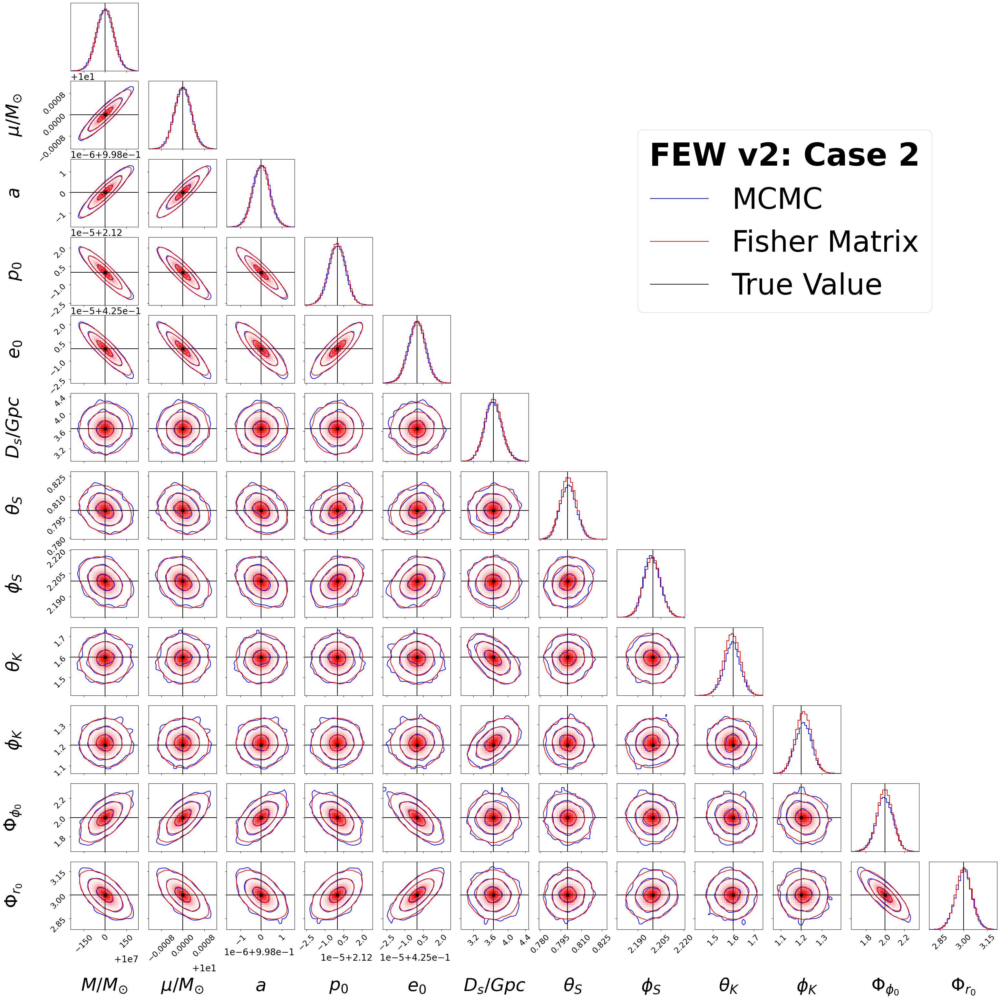

In [20]:
params_label_full = param_labels
N_params = len(param_labels)
corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(burned_samples_EMRI_1eneg5)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

corner.corner(FM_approx_samples, fig = figure, bins = 30, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI_case_1[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI_case_1[yi], color="k")
        ax.axvline(true_vals_EMRI_case_1[xi],color= "k")
        ax.plot(true_vals_EMRI_case_1[xi], true_vals_EMRI_case_1[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'MCMC')
red_line = mlines.Line2D([], [], color='red', label=r'Fisher Matrix')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "FEW v2: Case 2", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



In [21]:
file_path_1eneg5 = run_direc + '/Case_3_heavy_IMRI_prograde/' + "Heavy_IMRI_case_5_1eneg5.h5"

burned_samples_dict_EMRI_1eneg5, param_labels, true_vals_EMRI_case_1 =  load_samples_h5(file_path_1eneg5)

burned_samples_EMRI_1eneg5 = list(burned_samples_dict_EMRI_1eneg5.values())

N_params = len(param_labels)
N_samples = len(burned_samples_EMRI_1eneg5[0])

std_vecs = [np.std(burned_samples_EMRI_1eneg5[j]) for j in range(N_params)]
mean_vecs = np.array([np.mean(burned_samples_EMRI_1eneg5[j]) for j in range(N_params)])

fname = FM_direc + "/case_3/Fisher.h5"
with h5py.File(fname, "r") as f:
    FM = f["Fisher"][:,:]

Cov_Matrix = np.linalg.inv(FM)

FM_approx_samples = np.random.multivariate_normal(mean_vecs, Cov_Matrix, len(burned_samples_EMRI_1eneg5[0]))

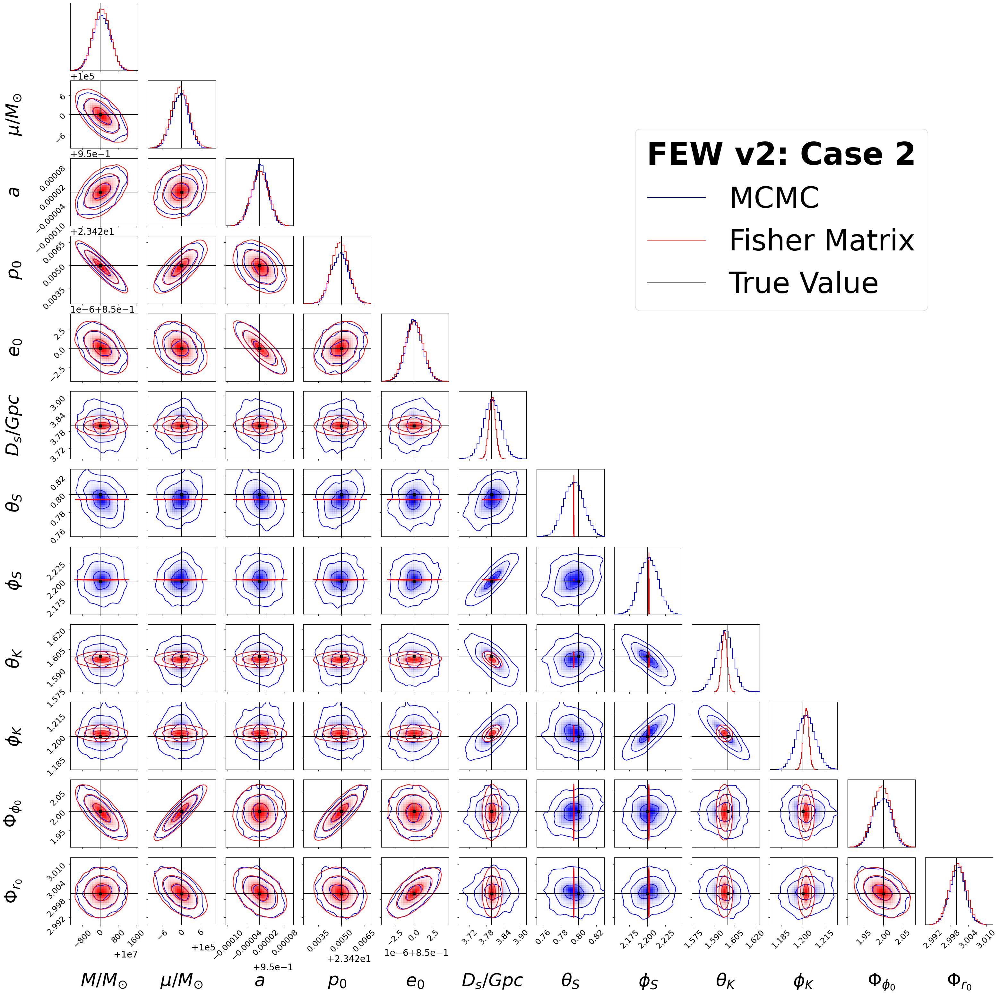

In [22]:
params_label_full = param_labels
N_params = len(param_labels)
corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(burned_samples_EMRI_1eneg5)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

corner.corner(FM_approx_samples, fig = figure, bins = 30, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI_case_1[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI_case_1[yi], color="k")
        ax.axvline(true_vals_EMRI_case_1[xi],color= "k")
        ax.plot(true_vals_EMRI_case_1[xi], true_vals_EMRI_case_1[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'MCMC')
red_line = mlines.Line2D([], [], color='red', label=r'Fisher Matrix')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "FEW v2: Case 2", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



In [24]:
file_path_1eneg5 = run_direc + '/Case_4_light_IMRI_prograde/' + "Light_IMRI_case_5_1eneg5.h5"

burned_samples_dict_EMRI_1eneg5, param_labels, true_vals_EMRI_case_1 =  load_samples_h5(file_path_1eneg5)

burned_samples_EMRI_1eneg5 = list(burned_samples_dict_EMRI_1eneg5.values())

N_params = len(param_labels)
N_samples = len(burned_samples_EMRI_1eneg5[0])

std_vecs = [np.std(burned_samples_EMRI_1eneg5[j]) for j in range(N_params)]
mean_vecs = np.array([np.mean(burned_samples_EMRI_1eneg5[j]) for j in range(N_params)])

fname = FM_direc + "/case_4/Fisher.h5"
with h5py.File(fname, "r") as f:
    FM = f["Fisher"][:,:]

Cov_Matrix = np.linalg.inv(FM)

FM_approx_samples = np.random.multivariate_normal(mean_vecs, Cov_Matrix, len(burned_samples_EMRI_1eneg5[0]))

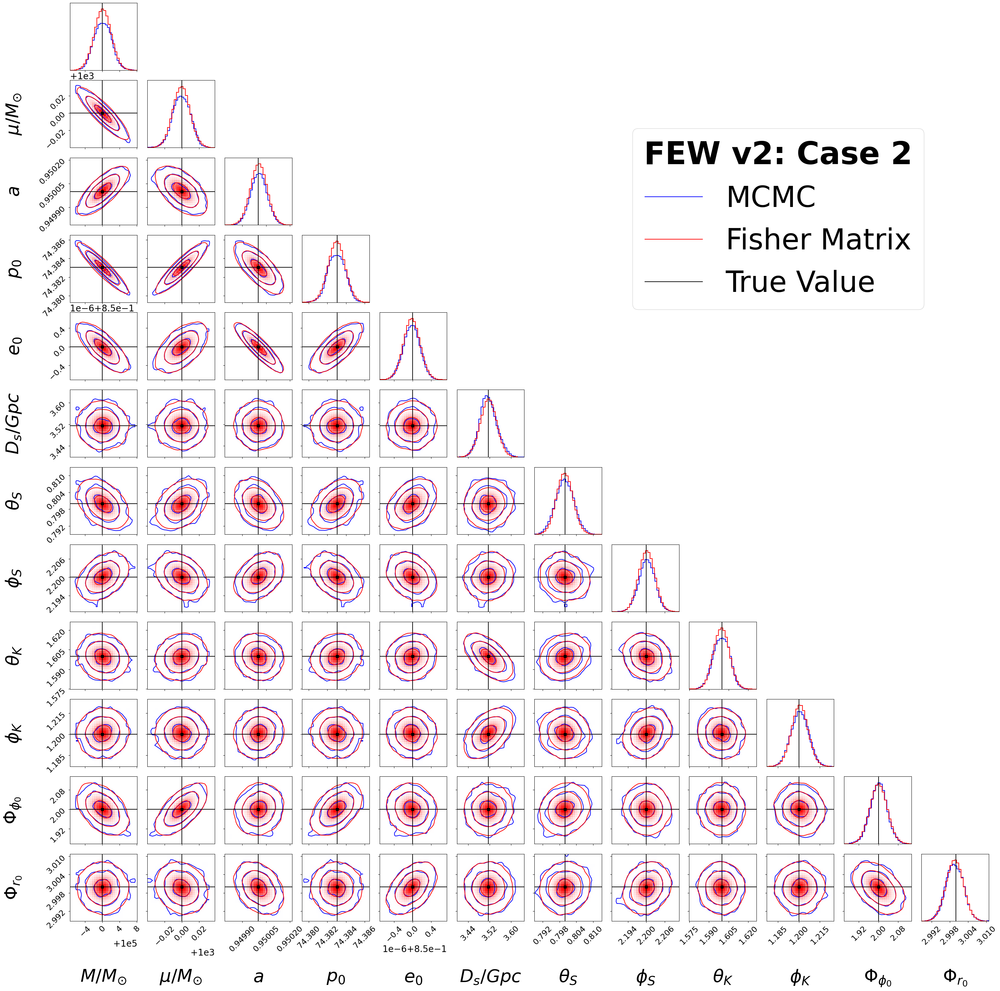

In [25]:
params_label_full = param_labels
N_params = len(param_labels)
corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(burned_samples_EMRI_1eneg5)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

corner.corner(FM_approx_samples, fig = figure, bins = 30, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_EMRI_case_1[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_EMRI_case_1[yi], color="k")
        ax.axvline(true_vals_EMRI_case_1[xi],color= "k")
        ax.plot(true_vals_EMRI_case_1[xi], true_vals_EMRI_case_1[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'MCMC')
red_line = mlines.Line2D([], [], color='red', label=r'Fisher Matrix')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "FEW v2: Case 2", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)



In [13]:
file_path_1eneg5 = run_direc + '/Case_5_EMRI_retrograde/' + "retrograde_EMRI_case_5_1eneg5.h5"
file_path_1eneg2 = run_direc + '/Case_5_EMRI_retrograde/' + "retrograde_EMRI_case_5_1eneg2.h5"

burned_samples_dict_retrograde_EMRI_1eneg5, param_labels, true_vals_retrograde_EMRI_case_5 =  load_samples_h5(file_path_1eneg5)
burned_samples_dict_retrograde_EMRI_1eneg2, _, _ =  load_samples_h5(file_path_1eneg2)

burned_samples_retrograde_EMRI_1eneg5 = list(burned_samples_dict_retrograde_EMRI_1eneg5.values())
burned_samples_retrograde_EMRI_1eneg2 = list(burned_samples_dict_retrograde_EMRI_1eneg2.values())

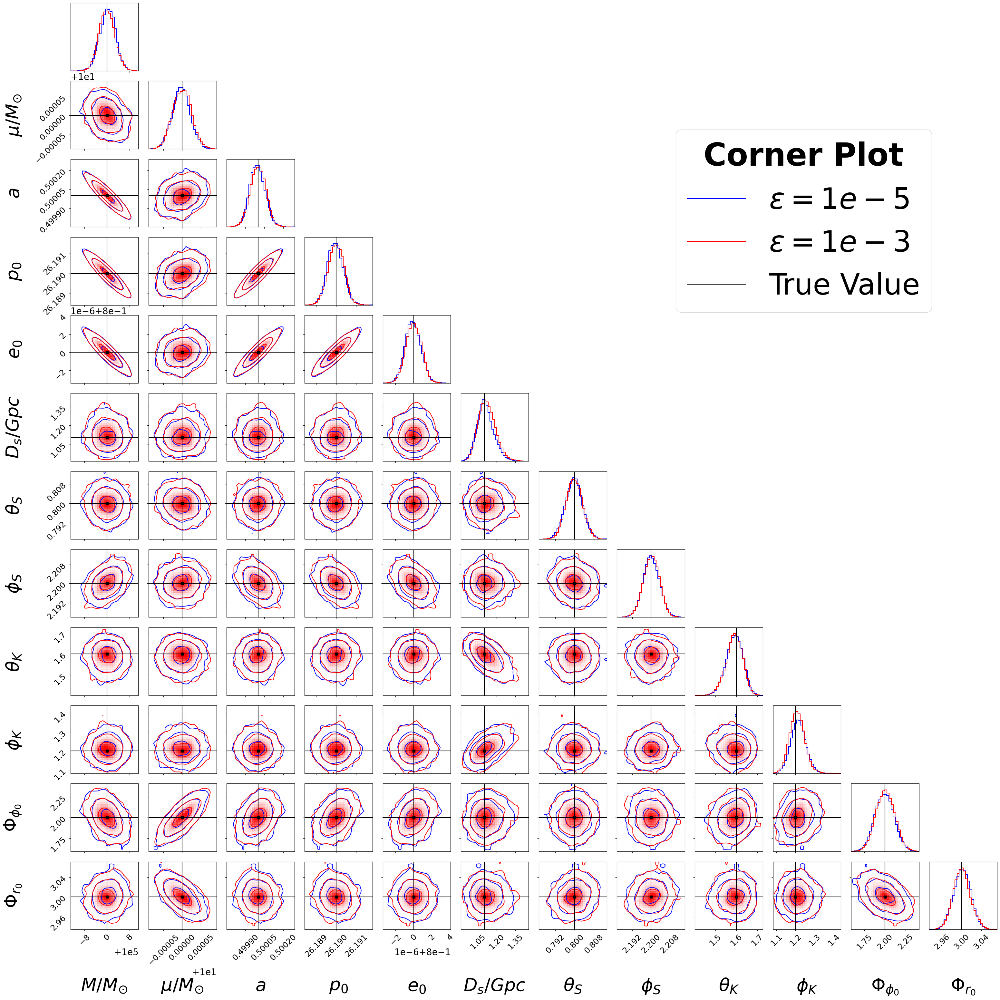

In [14]:
params_label_full = param_labels
N_params = len(param_labels)
corner_kwargs = dict(plot_datapoints=False,smooth1d=True,
                       labels=params_label_full, levels=(1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), 
                       label_kwargs=dict(fontsize=40), max_n_ticks=4,
                       show_titles=False, smooth = True, labelpad = 0.4)

samples_corner_1eneg5 = np.column_stack(burned_samples_retrograde_EMRI_1eneg5)
samples_corner_1eneg2 = np.column_stack(burned_samples_retrograde_EMRI_1eneg2)

figure = corner.corner(samples_corner_1eneg5,bins = 30, color = 'blue', **corner_kwargs)

weights = (len(samples_corner_1eneg5[:,0])/len(samples_corner_1eneg2[:,0]))*np.ones(len(samples_corner_1eneg2[:,0]))
corner.corner(samples_corner_1eneg2, fig = figure, bins = 30, weights = weights, color = 'red', **corner_kwargs)

axes = np.array(figure.axes).reshape((N_params, N_params))

for i in range(N_params):
    ax = axes[i, i]
    ax.axvline(true_vals_retrograde_EMRI_case_5[i], color="k")

for yi in range(N_params):
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axhline(true_vals_retrograde_EMRI_case_5[yi], color="k")
        ax.axvline(true_vals_retrograde_EMRI_case_5[xi],color= "k")
        ax.plot(true_vals_retrograde_EMRI_case_5[xi], true_vals_retrograde_EMRI_case_5[yi], "sk")

for ax in figure.get_axes():
    ax.tick_params(axis='both', labelsize=18)
blue_line = mlines.Line2D([], [], color='blue', label=r'$\epsilon = 1e-5$')
red_line = mlines.Line2D([], [], color='red', label=r'$\epsilon = 1e-3$')
black_line = mlines.Line2D([], [], color='black', label='True Value')

plt.legend(handles=[blue_line, red_line, black_line], fontsize = 65, frameon = True, bbox_to_anchor=(0.25, N_params), loc="upper right", title = "Corner Plot", title_fontproperties = FontProperties(size = 70, weight = 'bold'))
plt.subplots_adjust(left=-0.1, bottom=-0.1, right=None, top=None, wspace=0.15, hspace=0.15)